In [ ]:
!pip install mediapipe


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 43.7 MB/s eta 0:00:00


In [ ]:
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline, StableDiffusionInpaintPipeline
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

# Base text-to-image pipeline
model_id = "runwayml/stable-diffusion-v1-5"
pipe_txt2img = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe_txt2img = pipe_txt2img.to(device)

# Image-to-Image pipeline
pipe_img2img = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe_img2img = pipe_img2img.to(device)

# Inpainting pipeline
pipe_inpaint = StableDiffusionInpaintPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe_inpaint = pipe_inpaint.to(device)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
import os

def save_images(paired_images, output_dir="paired_dataset"):
    os.makedirs(output_dir, exist_ok=True)
    for idx, (clean, beard) in enumerate(paired_images):
        clean.save(os.path.join(output_dir, f"image_{idx}_clean.png"))
        beard.save(os.path.join(output_dir, f"image_{idx}_beard.png"))


In [ ]:
from PIL import Image, ImageDraw, ImageFilter
import random
import matplotlib.pyplot as plt
import numpy as np
import cv2

import cv2
import numpy as np
from PIL import Image, ImageDraw
import mediapipe as mp

def create_beard_mask(image):
    """
    Create a mask for the lower part of the face where the beard should be added.

    Args:
        image: PIL Image, clean-shaven portrait.

    Returns:
        mask: PIL Image, binary mask with white for the beard area and black elsewhere.
    """
    # Convert PIL image to NumPy array
    image_np = np.array(image.convert("RGB"))

    # Initialize MediaPipe Face Detection
    mp_face_detection = mp.solutions.face_detection
    face_detection = mp_face_detection.FaceDetection(min_detection_confidence=0.5)

    # Convert the image to RGB for MediaPipe processing
    image_rgb = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

    # Detect faces
    results = face_detection.process(image_rgb)

    # Create an empty binary mask
    mask = Image.new("L", image.size, 0)
    draw = ImageDraw.Draw(mask)

    if results.detections:
        for detection in results.detections:
            # Extract bounding box from MediaPipe
            bbox = detection.location_data.relative_bounding_box
            img_width, img_height = image.size
            x_min = int(bbox.xmin * img_width)
            y_min = int(bbox.ymin * img_height)
            width = int(bbox.width * img_width)
            height = int(bbox.height * img_height)

            # Define the lower part of the face for the beard region
            beard_region_top = int(y_min + height * 0.60)  # Starting at 60% of the face height
            beard_region_bottom = y_min + height
            beard_region = [(x_min, beard_region_top), (x_min + width, beard_region_bottom)]

            # Draw the beard region on the mask
            draw.rectangle(beard_region, fill=255)

    return mask


In [ ]:
def generate_paired_images(pipe_txt2img, pipe_inpaint, pipe_img2img, cfg_scale, seed=None):
    """
    Generate a pair of images: one clean-shaven (text-to-image) and one with a beard (inpainting + img2img).

    Args:
        pipe_txt2img: Stable Diffusion text-to-image pipeline.
        pipe_inpaint: Stable Diffusion inpainting pipeline.
        pipe_img2img: Stable Diffusion image-to-image pipeline.
        cfg_scale: Guidance scale for image generation.
        seed: Random seed for reproducibility.

    Returns:
        A tuple of clean-shaven and bearded images.
    """
    if seed is None:
        seed = random.randint(0, 10000)

    generator = torch.Generator("cuda").manual_seed(seed)

    # Step 1: Generate the clean-shaven image
    clean_shaven_prompt = "portrait of a clean-shaven man from front, realistic, high-resolution, 512x512"
    clean_negative_prompt = "profile, beard, cartoonish, outdated, low-quality, blurry"
    clean_shaven_image = pipe_txt2img(
        prompt=clean_shaven_prompt,
        generator=generator,
        negative_prompt=clean_negative_prompt,
        # height=512,
        # width=512,
        guidance_scale=13
    ).images[0]

    # Step 4: Refine with img2img
    img2img_bearded_prompt = "portrait of the exact same man with a photorealistic, well-groomed realistic beard, detailed, realistic"
    img2img_bearded_negative_prompt = "cartoonish, outdated, low-quality, blurry, clean-shave, abstract elements, wrinkle, old"
    img2img_bearded_image = pipe_img2img(
        prompt=img2img_bearded_prompt,
        negative_prompt=img2img_bearded_negative_prompt,
        image=clean_shaven_image,
        strength=0.3,  # Adjust strength for blending
        # height=512,
        # width=512,
        guidance_scale=12,
        generator=generator
    ).images[0]

    # Step 2: Create a refined mask for the beard area
    mask = create_beard_mask(clean_shaven_image)

    # Step 3: Inpaint the beard
    inpainting_prompt = "Hyper-realistic light stubble beard without changing lips, detailed texture, natural blending with facial features, seamless integration, photorealistic, soft lighting, realistic color tones, and sharp detailing"
    inpainting_image = pipe_inpaint(
        prompt=inpainting_prompt,
        negative_prompt="well-groomed, cartoonish, low-quality, abstract elements",
        image=clean_shaven_image,
        mask_image=mask,
        guidance_scale=cfg_scale,
    ).images[0]

    # Step 4: Refine with img2img
    bearded_prompt = "portrait of the exact same man with a photorealistic, well-groomed realistic beard, detailed, realistic"
    bearded_negative_prompt = "cartoonish, outdated, low-quality, blurry, abstract elements, wrinkle, old"
    bearded_image = pipe_img2img(
        prompt=bearded_prompt,
        negative_prompt=bearded_negative_prompt,
        image=inpainting_image,
        strength=0.2,  # Adjust strength for blending
        # height=512,
        # width=512,
        guidance_scale=8,
        generator=generator
    ).images[0]

    return clean_shaven_image, img2img_bearded_image, inpainting_image, bearded_image

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

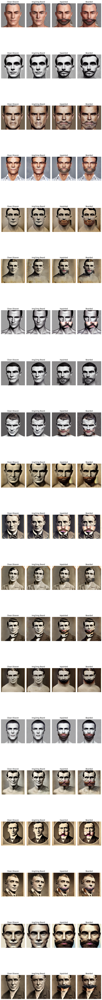

In [ ]:
paired_images = []
cfg_scale = 9

for i in range(20):  # Adjust for the desired number of pairs
    clean, img2img_beard, inpainted, beard = generate_paired_images(pipe_txt2img, pipe_inpaint, pipe_img2img, cfg_scale, seed=1284 + i)
    paired_images.append((clean, img2img_beard, inpainted, beard))

def display_paired_images(pairs):
    fig, axes = plt.subplots(len(pairs), 4, figsize=(10, 5 * len(pairs)))
    for idx, (clean, img2img_beard, inpainted, beard) in enumerate(pairs):
        axes[idx, 0].imshow(clean)
        axes[idx, 0].set_title("Clean-Shaven")
        axes[idx, 0].axis("off")

        axes[idx, 1].imshow(img2img_beard)
        axes[idx, 1].set_title("Img2img Beard")
        axes[idx, 1].axis("off")

        axes[idx, 2].imshow(inpainted)
        axes[idx, 2].set_title("Inpainted")
        axes[idx, 2].axis("off")

        axes[idx, 3].imshow(beard)
        axes[idx, 3].set_title("Bearded")
        axes[idx, 3].axis("off")

    plt.tight_layout()
    plt.show()

display_paired_images(paired_images)